# Capstone Project - The Battle of the Neighborhoods (Week 2)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: Business Problem <a name="introduction"></a>

As part of the Final Captone Project of the IBM Data Science Course, we will explore the suitability to open a new Yoga Studio in the **Torun** neighbourhood, Poland.

Torun already has a huge gym and yoga studio, however, if we are going to open a small business, I would like to explore **any locations may still be a feasible suggestion, or not at all**. 

There are a number of parameters we can assume, for example in decending priority below:
    1. proximity to areas with more lively business around e.g. town centre
    2. proximity to residential area
    3. proximity to work area

On top of the above search priority, we are also concern with **an area with no immediate competitor**. We also prefer locations **with complementary business around (e.g. gym but with no yoga studio, hotel, swimming pool) which may help us attract potential clients**

This business problems will possibly be interested to any furture business owners in any neightbourhoods, to follow a similar search approach and enrich with any addition search method before making a business decision.

## Description of Data <a name="data"></a>

To solve our business problem, we will analyze below factors of the neighbourhood before making the business decision:
* distance to town center
* any existing yoga studio in the neighbourhood
* number of and distance to lively business (e.g restaurants, markets, shopping centre), if any

Torun has 24 boroughs according to Wikipedia. We get the latitude & longitude coordinates for these districts to start exploring our candidate neighbourhoods.

Required information will be extracted and generated as data sources by:
* Geospatial coordinates of town center and neighbourhood using **Geopy Library**
* Geospatial coordinates and addresses can also be retrieved by using **Google Cloud Service - Google Map API**
* Venue data using **Foursquare API**


### Neighborhood Candidates

Latitude & longitude coordinates of our candidate neighborhoods is created for the 24 boroughs to use as centroids for search. The latitude & longitude is made available by using the Google Maps geocoding API.

In [9]:
!pip install BeautifulSoup4
!pip install requests
!pip install python-dotenv
!pip install plotly==4.8.1
!pip install "notebook>=5.3" "ipywidgets>=7.2"
#!pip install shapely
#!pip install pyproj

In [10]:
import pandas as pd
import numpy as np 
import json # library to handle JSON files
# tranform JSON file into a pandas dataframe
from pandas.io.json import json_normalize 
import requests # library to handle requests

import shapely.geometry

import pyproj
import pickle

from bs4 import BeautifulSoup
import os

#!conda install -c conda-forge folium=0.5.0 --yes
import folium
from folium import plugins
from folium.plugins import HeatMap

#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert address into lat and lng

import plotly.express as px

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline

# import k-means from clustering stage
from sklearn.cluster import KMeans

import seaborn as sns

from scipy.spatial.distance import cdist
import math

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML

print('libraries imported!')

libraries imported!


## Gathering Useful Data

### Step 1: Create Map of Business Area

In this case, create the plain map of the Torun area, Poland.

In [11]:
# create map of Torun areas
address = "Torun, Poland"

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print((location.latitude, location.longitude))

map_torun = folium.Map(location=[latitude, longitude], zoom_start=12)
map_torun

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: Using Nominatim with the default "geopy/1.22.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  after removing the cwd from sys.path.


(53.0102721, 18.6048094)


In [12]:
import requests

#geocoding and reverse geocoding
# Referenced github: piyushgupta00

def get_coordinates(api_key, address, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&address={}'.format(api_key, address)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        geographical_data = results[0]['geometry']['location'] # get geographical coordinates
        lat = geographical_data['lat']
        lon = geographical_data['lng']
        return [lat, lon]
    except:
        return [None, None]

def get_address(api_key, latitude, longitude, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&latlng={},{}'.format(api_key, latitude, longitude)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        address = results[0]['formatted_address']
        return address
    except:
        return None


# get geo locations of a list of addresses
def geo_location(addresses):
    
    data = []

    for address in addresses:
        geolocator = Nominatim()
        location = geolocator.geocode(f"{address}, Torun, Poland")
        latitude = location.latitude
        longitude = location.longitude
        
        data.append(
        {
            'Boroughs': address,
            'Longitude': longitude,
            'Latitude': latitude
        }
    )
    
    return data

print('function ready')

function ready


In [13]:
import getpass
# reverse geocoding
address = "Torun, Poland"

api_key = getpass.getpass() # API Key credentials is hidden 
lat, lng = get_coordinates(api_key, address, verbose=False)
torun_corr = lat, lng

print(f'The geograpical coordinates of {address} are {lat}, {lng}.')

get_address = get_address(api_key, lat, lng)

print(f'The address of {lat, lng} is {get_address}.')

········
The geograpical coordinates of Torun, Poland are 53.0137902, 18.5984437.
The address of (53.0137902, 18.5984437) is DK80, 87-100 Toruń, Poland.


In [14]:
# Reference: fdsim documentation 
# https://fdsim.readthedocs.io/en/latest/_modules/helpers.html#lonlat_to_xy
from pyproj import Proj, transform

def lonlat_to_xy(lon, lat):
    """Convert (longitude, latitude) coordinates to (x, y).
    Requires `pyproj` to be installed.
    """
    proj_latlon = Proj(proj='latlong',datum='WGS84')
    proj_xy = Proj(proj="utm", zone=33, datum='WGS84')
    x, y = transform(proj_latlon, proj_xy, lon, lat)
    return x, y

def xy_to_lonlat(x, y):
    """Convert (x, y) coordinates to (longitude, latitude).
    Requires `pyproj` to be installed.
    """
    proj_latlon = Proj(proj='latlong',datum='WGS84')
    proj_xy = Proj(proj="utm", zone=33, datum='WGS84')
    lon, lat = transform(proj_xy, proj_latlon, x, y)
    return lon, lat

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

print('Coordinate transformation check')
print('-------------------------------')
print(f'Torun longitude={torun_corr[1]}, latitude={torun_corr[0]}')
x, y = lonlat_to_xy(torun_corr[1],torun_corr[0])
print('Torun UTM X={}, Y={}'.format(x, y))
lo, la = xy_to_lonlat(x, y)
print('Torun longitude={}, latitude={}'.format(lo, la))

Coordinate transformation check
-------------------------------
Torun longitude=18.5984437, latitude=53.0137902
Torun UTM X=741372.1652841901, Y=5879862.497349542
Torun longitude=18.5984437, latitude=53.013790199999995


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  # This is added back by InteractiveShellApp.init_path()
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


### Step 2: Get Boroughs Coordinates of the Neighbourhood in the Business Area

We use a function and the Geopy library to generate the longitude and latitude coordinates of the neighbourhood.

This is created into a Pandas dataframe.

In [15]:
# initialize list of 24 boroughs
boroughs = ['Barbarka', 'Bielany', 'Bielawy', 'Bydgoskie Przedmieście', 'Chełmińskie Przedmieście', 'Czerniewice',
            'Glinki', 'Grębocin nad Strugą', 'Jakubskie Przedmieście', 'Kaszczorek', 'Katarzynka', 'Koniuchy', 'Mokre',
            'Na Skarpie', 'Piaski', 'Podgórz', 'Rubinkowo', 'Rudak', 'Rybaki', 'Stare Miasto', 'Starotoruńskie',
            'Przedmieście', 'Stawki', 'Winnica', 'Wrzosy']

# create dataframe of the 24 boroughs with their geodata
df = pd.DataFrame(geo_location(boroughs))
df

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: DeprecationWarning: Using Nominatim with the default "geopy/1.22.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.


,Boroughs,Latitude,Longitude
0,Barbarka,53.053819,18.541648
1,Bielany,53.025359,18.568668
2,Bielawy,53.282226,18.740640
3,Bydgoskie Przedmieście,53.010490,18.576364
4,Chełmińskie Przedmieście,53.022616,18.594666
5,Czerniewice,52.979523,18.684492
6,Glinki,52.945260,18.340220
7,Grębocin nad Strugą,53.048392,18.706664
8,Jakubskie Przedmieście,53.019558,18.634295
9,Kaszczorek,53.007971,18.699385


In [16]:
# instantiate a feature group for the boroughs in the dataframe
borough = folium.map.FeatureGroup()

# loop through the 24 boroughs and add marker to the borough feature group
for lat, lng, label in zip(df.Latitude, df.Longitude, df.Boroughs):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=25,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='blue',
        fill_opacity=0.3,
        parse_html=False).add_to(map_torun)  

map_torun

Visualization of the distribution of the 24 boroughs of Torun is shown.

In [17]:
# get town center coordinates
address = 'Stare Miasto, Torun, Poland'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
old_town_coor = (location.latitude, location.longitude)
print(f"Coordinate of (Old Town) {address} is : ")
print(old_town_coor)


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: Using Nominatim with the default "geopy/1.22.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  after removing the cwd from sys.path.


Coordinate of (Old Town) Stare Miasto, Torun, Poland is : 
(53.0116718, 18.609319116005494)


### Step 3: Get Distance from the Center of Business: Old Town (Stare Miasto)

Distance between the neighbourhood and town center is added to the dataframe. 

By the assumption that the town center, usually the Old Town or New Town areas are the center of business activities. 

In [18]:
df.shape

(25, 3)

In [19]:
# get great-circle distance from town center
from geopy.distance import great_circle

town_center = old_town_coor
print("Town Center Stare Miasto (Old Town) coordinates: ") 
print(town_center)

dist_from_old_town = []

for i in range(25):
    neighbourhood_coor = (df['Latitude'][i], df['Longitude'][i])
    distance = great_circle(town_center, neighbourhood_coor).kilometers
    dist_from_old_town.append(distance)

df['Distance downtown (km)'] = dist_from_old_town

# sort data according to closest (ascending) distance from town center
df = df.sort_values('Distance downtown (km)')
df


Town Center Stare Miasto (Old Town) coordinates: 
(53.0116718, 18.609319116005494)


,Boroughs,Latitude,Longitude,Distance downtown (km)
19,Stare Miasto,53.011672,18.609319,0.000000
18,Rybaki,53.006466,18.591805,1.306968
4,Chełmińskie Przedmieście,53.022616,18.594666,1.562586
8,Jakubskie Przedmieście,53.019558,18.634295,1.886896
12,Mokre,53.028967,18.621943,2.100365
14,Piaski,52.999470,18.583759,2.183068
3,Bydgoskie Przedmieście,53.010490,18.576364,2.208700
21,Przedmieście,53.010490,18.576364,2.208700
11,Koniuchy,53.033814,18.599533,2.547583
22,Stawki,52.991229,18.635039,2.851184


In [20]:
# reset index
df = df.reset_index(drop=True)
print('done reset index.')

done reset index.


In [21]:
df.head(16)

,Boroughs,Latitude,Longitude,Distance downtown (km)
0,Stare Miasto,53.011672,18.609319,0.000000
1,Rybaki,53.006466,18.591805,1.306968
2,Chełmińskie Przedmieście,53.022616,18.594666,1.562586
3,Jakubskie Przedmieście,53.019558,18.634295,1.886896
4,Mokre,53.028967,18.621943,2.100365
5,Piaski,52.999470,18.583759,2.183068
6,Bydgoskie Przedmieście,53.010490,18.576364,2.208700
7,Przedmieście,53.010490,18.576364,2.208700
8,Koniuchy,53.033814,18.599533,2.547583
9,Stawki,52.991229,18.635039,2.851184


### Step 4: Initiate Foursquare to get Nearby Venues of the Town Center

We use the Foursquare API to look at 100 nearby venues within radius of 1000 meters of the specified neighbourhood.

Below we are going to visualize and analyze nearby venues of:
1. Stare Miasto (Old Town), Toruń (which is supposed to be the Toruń centre)
2. All Neighbourhoods of Toruń (to look at all the business activities around Toruń)

In [22]:
# @hidden_cell
CLIENT_ID = 'AROZFDY52RXWT1LW5OCM02WJBWNUYGPMA5IXKCZHWR4YSZ3L' # your Foursquare ID
CLIENT_SECRET = getpass.getpass() # your Foursquare Secret (hidden)
VERSION = '20190513'  # Foursquare API version
print('Foursquare initiated.')


········
Foursquare initiated.


In [23]:
# Get data of town center itself
neighbourhood_latitude = df['Latitude'][0] # Neighbourhood latitude value
neighbourhood_longitude = df['Longitude'][0] # Neighbourhood longitude value

neighbourhood_name = df['Boroughs'][0] # Neighbourhood name

print(f'{neighbourhood_name} (Latitude, Longitude) : {neighbourhood_latitude}, {neighbourhood_longitude}.')

Stare Miasto (Latitude, Longitude) : 53.0116718, 18.609319116005494.


In [24]:
### Look at 100 nearby venues within a defined radius in meters of the coordinates specified (Old Town)
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 1000 # define radius (meters)
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighbourhood_latitude, 
    neighbourhood_longitude, 
    radius, 
    LIMIT)

# get the result to a json file
results = requests.get(url).json()
print('results imported to JSON file.')

results imported to JSON file.


In [25]:
results

{'meta': {'code': 200, 'requestId': '5ee23ace4d8e2536ebe895bf'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Toruń',
  'headerFullLocation': 'Toruń',
  'headerLocationGranularity': 'city',
  'totalResults': 77,
  'suggestedBounds': {'ne': {'lat': 53.020671809000014,
    'lng': 18.624250006590263},
   'sw': {'lat': 53.00267179099999, 'lng': 18.594388225420726}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4f1c46ebe4b04ae083f671ba',
       'name': 'Koi Sushi',
       'location': {'address': 'Małe Garbary 19',
        'lat': 53.011777803323234,
        'lng': 18.60849018274377,
        'labeledLatLngs': [{'label': 'display',
          'lat': 53.011777803323234,
          'lng'

Let us get the nearby venues around Old Town or the town center now:

In [26]:
def get_category_type(row):
    try:
        categories_list = row['categories']
        print(f'categories_list try : {categories_list}')
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        print(f'categories_list : {categories_list[0]}')
        print(f'categories_list[0] : {categories_list[0]}')
        print(f"categories_list[0]['name'] : {categories_list[0]['name']}")
        return categories_list[0]['name']

venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON to dataframe
nearby_venues



,reasons.count,reasons.items,referralId,venue.categories,venue.id,venue.location.address,venue.location.cc,venue.location.city,venue.location.country,venue.location.crossStreet,...,venue.location.labeledLatLngs,venue.location.lat,venue.location.lng,venue.location.neighborhood,venue.location.postalCode,venue.location.state,venue.name,venue.photos.count,venue.photos.groups,venue.venuePage.id
0,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4f1c46ebe4b04ae083f671ba-0,"[{'id': '4bf58dd8d48988d1d2941735', 'name': 'S...",4f1c46ebe4b04ae083f671ba,Małe Garbary 19,PL,Toruń,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01177780332323...",53.011778,18.608490,NaN,NaN,Województwo kujawsko-pomorskie,Koi Sushi,0,[],NaN
1,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4eede75e61af1accaf3b2172-1,"[{'id': '4bf58dd8d48988d16d941735', 'name': 'C...",4eede75e61af1accaf3b2172,Podmurna,PL,Toruń,Polska,NaN,...,"[{'label': 'display', 'lat': 53.0103676256716,...",53.010368,18.608665,NaN,NaN,Województwo kujawsko-pomorskie,Róże i Zen,0,[],NaN
2,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-50d1b2d2e4b03d008232b251-2,"[{'id': '4bf58dd8d48988d1c4941735', 'name': 'R...",50d1b2d2e4b03d008232b251,Szeroka 9,PL,Toruń,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01065970092045...",53.010660,18.608163,NaN,87-100,Województwo kujawsko-pomorskie,Szeroka No 9,0,[],NaN
3,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4ff040eee4b0730ed855b8f6-3,"[{'id': '4bf58dd8d48988d1e0931735', 'name': 'C...",4ff040eee4b0730ed855b8f6,Strumykowa 2,PL,Toruń,Polska,Szeroka,...,"[{'label': 'display', 'lat': 53.01097798358943...",53.010978,18.608622,NaN,87-100,Województwo kujawsko-pomorskie,Central Coffee Perks,0,[],NaN
4,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4be949bad837c9b6ea34a606-4,"[{'id': '4bf58dd8d48988d11b941735', 'name': 'P...",4be949bad837c9b6ea34a606,Browarna 6,PL,Toruń,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01105180977620...",53.011052,18.612019,NaN,NaN,Województwo kujawsko-pomorskie,Klub NRD,0,[],NaN
5,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4fd0ce43e4b0c3edb5f3057e-5,"[{'id': '4bf58dd8d48988d1c9941735', 'name': 'I...",4fd0ce43e4b0c3edb5f3057e,NaN,PL,NaN,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01085220123718...",53.010852,18.609500,NaN,NaN,NaN,Lenkiewicz Lody,0,[],NaN
6,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4e8499df7bebd842c95918c5-6,"[{'id': '4bf58dd8d48988d164941735', 'name': 'P...",4e8499df7bebd842c95918c5,Ul. Rynek Staromiejski,PL,Toruń,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01057630136877...",53.010576,18.603919,NaN,87-100,Województwo kujawsko-pomorskie,Rynek Staromiejski,0,[],NaN
7,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-5245cc3811d2d3a48a4e7f2d-7,"[{'id': '4bf58dd8d48988d11b941735', 'name': 'P...",5245cc3811d2d3a48a4e7f2d,Szewska,PL,NaN,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01132483935419...",53.011325,18.605119,NaN,NaN,NaN,Kredens,0,[],NaN
8,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4c82271e2f1c236a73703643-8,"[{'id': '4bf58dd8d48988d190941735', 'name': 'H...",4c82271e2f1c236a73703643,Rynek Staromiejski,PL,Toruń,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01075401978299...",53.010754,18.604300,NaN,NaN,Województwo kujawsko-pomorskie,Ratusz,0,[],NaN
9,0,"[{'summary': 'This spot is popular', 'type': '...",e-0-4c6c408f1fb2a143a6f2fae6-9,"[{'id': '4bf58dd8d48988d10f941735', 'name': 'I...",4c6c408f1fb2a143a6f2fae6,Prosta 12/14,PL,Toruń,Polska,NaN,...,"[{'label': 'display', 'lat': 53.01238003183865...",53.012380,18.608643,NaN,87-100,Województwo kujawsko-pomorskie,Royal India,0,[],NaN


In [27]:
# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

nearby_venues

,venue.name,venue.categories,venue.location.lat,venue.location.lng
0,Koi Sushi,"[{'id': '4bf58dd8d48988d1d2941735', 'name': 'S...",53.011778,18.608490
1,Róże i Zen,"[{'id': '4bf58dd8d48988d16d941735', 'name': 'C...",53.010368,18.608665
2,Szeroka No 9,"[{'id': '4bf58dd8d48988d1c4941735', 'name': 'R...",53.010660,18.608163
3,Central Coffee Perks,"[{'id': '4bf58dd8d48988d1e0931735', 'name': 'C...",53.010978,18.608622
4,Klub NRD,"[{'id': '4bf58dd8d48988d11b941735', 'name': 'P...",53.011052,18.612019
5,Lenkiewicz Lody,"[{'id': '4bf58dd8d48988d1c9941735', 'name': 'I...",53.010852,18.609500
6,Rynek Staromiejski,"[{'id': '4bf58dd8d48988d164941735', 'name': 'P...",53.010576,18.603919
7,Kredens,"[{'id': '4bf58dd8d48988d11b941735', 'name': 'P...",53.011325,18.605119
8,Ratusz,"[{'id': '4bf58dd8d48988d190941735', 'name': 'H...",53.010754,18.604300
9,Royal India,"[{'id': '4bf58dd8d48988d10f941735', 'name': 'I...",53.012380,18.608643


In [28]:
# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)


categories_list : {'id': '4bf58dd8d48988d1d2941735', 'name': 'Sushi Restaurant', 'pluralName': 'Sushi Restaurants', 'shortName': 'Sushi', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/sushi_', 'suffix': '.png'}, 'primary': True}
categories_list[0] : {'id': '4bf58dd8d48988d1d2941735', 'name': 'Sushi Restaurant', 'pluralName': 'Sushi Restaurants', 'shortName': 'Sushi', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/sushi_', 'suffix': '.png'}, 'primary': True}
categories_list[0]['name'] : Sushi Restaurant
categories_list : {'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}
categories_list[0] : {'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}
categories_l

In [29]:
nearby_venues

,venue.name,venue.categories,venue.location.lat,venue.location.lng
0,Koi Sushi,Sushi Restaurant,53.011778,18.608490
1,Róże i Zen,Café,53.010368,18.608665
2,Szeroka No 9,Restaurant,53.010660,18.608163
3,Central Coffee Perks,Coffee Shop,53.010978,18.608622
4,Klub NRD,Pub,53.011052,18.612019
5,Lenkiewicz Lody,Ice Cream Shop,53.010852,18.609500
6,Rynek Staromiejski,Plaza,53.010576,18.603919
7,Kredens,Pub,53.011325,18.605119
8,Ratusz,History Museum,53.010754,18.604300
9,Royal India,Indian Restaurant,53.012380,18.608643


In [30]:
# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head(50) # the flatten JSON 




,name,categories,lat,lng
0,Koi Sushi,Sushi Restaurant,53.011778,18.608490
1,Róże i Zen,Café,53.010368,18.608665
2,Szeroka No 9,Restaurant,53.010660,18.608163
3,Central Coffee Perks,Coffee Shop,53.010978,18.608622
4,Klub NRD,Pub,53.011052,18.612019
5,Lenkiewicz Lody,Ice Cream Shop,53.010852,18.609500
6,Rynek Staromiejski,Plaza,53.010576,18.603919
7,Kredens,Pub,53.011325,18.605119
8,Ratusz,History Museum,53.010754,18.604300
9,Royal India,Indian Restaurant,53.012380,18.608643


### Step 5: Venue Categories in Old Town, Toruń

We will first clean up the data, and then plot by the **value_counts** of **categories**

In [31]:
category_count = nearby_venues['categories'].value_counts().to_frame()
category_count.rename(columns={'categories': 'value_counts'}, inplace=True)
category_count.index.name = 'categories'

category_count = category_count.reset_index()
print(category_count.shape)
category_count

(44, 2)


,categories,value_counts
0,Hotel,6
1,Pub,4
2,Café,4
3,Museum,3
4,Italian Restaurant,3
5,Ice Cream Shop,3
6,Coffee Shop,3
7,Pizza Place,3
8,Plaza,3
9,Scenic Lookout,2


In [32]:
# Clean the column 'categories' data according to category types.
def clean(dataframe, header: str, keyword: str, replace: str):
    df_clean = dataframe.loc[dataframe[header].str.contains(keyword), header] = replace
    return df_clean

# Clean recursively:
def clean_df(dataframe, header: str):
    df_clean = clean(dataframe, header, 'Restaurant', 'Restaurant')
    df_clean = clean(dataframe, header, 'Museum', 'Museum and Gallery')
    df_clean = clean(dataframe, header, 'Gallery', 'Museum and Gallery')
    df_clean = clean(dataframe, header, 'Bar', 'Bar or Pub')
    df_clean = clean(dataframe, header, 'Rock Club', 'Bar or Pub')
    df_clean = clean(dataframe, header, 'Pub', 'Bar or Pub')
    df_clean = clean(dataframe, header, 'Scenic', 'Touristic Landmark')
    df_clean = clean(dataframe, header, 'Historic', 'Touristic Landmark')
    df_clean = clean(dataframe, header, 'Café', 'Café or Coffee Shop')
    df_clean = clean(dataframe, header, 'Coffee Shop', 'Café or Coffee Shop')
    df_clean = clean(dataframe, header, 'Hotel', 'Hotel or B&B')
    df_clean = clean(dataframe, header, 'Bed & Breakfast', 'Hotel or B&B')
    return df_clean

clean_df(category_count, 'categories')

category_count_clean = category_count.groupby(['categories'],as_index=False).sum().sort_values(by='value_counts', ascending=False)
category_count_clean = category_count_clean.reset_index(drop=True)
print(category_count_clean.shape)
category_count_clean

(27, 2)


,categories,value_counts
0,Restaurant,16
1,Bar or Pub,8
2,Hotel or B&B,8
3,Café or Coffee Shop,7
4,Museum and Gallery,6
5,Touristic Landmark,4
6,Plaza,3
7,Pizza Place,3
8,Ice Cream Shop,3
9,Creperie,2


We will look at the top10 **categories** and plot the top10 below.

In [33]:
category_count_clean.sort_values(['value_counts'], ascending=False, axis=0, inplace=True)
cat_top10 = category_count_clean.set_index('categories').head(10)

cat_top10.head(10)

,value_counts
categories,
Restaurant,16
Bar or Pub,8
Hotel or B&B,8
Café or Coffee Shop,7
Museum and Gallery,6
Touristic Landmark,4
Plaza,3
Pizza Place,3
Ice Cream Shop,3


In [34]:
cat_top10 = cat_top10['value_counts'].tail(10)
cat_top10

categories
Restaurant             16
Bar or Pub              8
Hotel or B&B            8
Café or Coffee Shop     7
Museum and Gallery      6
Touristic Landmark      4
Plaza                   3
Pizza Place             3
Ice Cream Shop          3
Creperie                2
Name: value_counts, dtype: int64

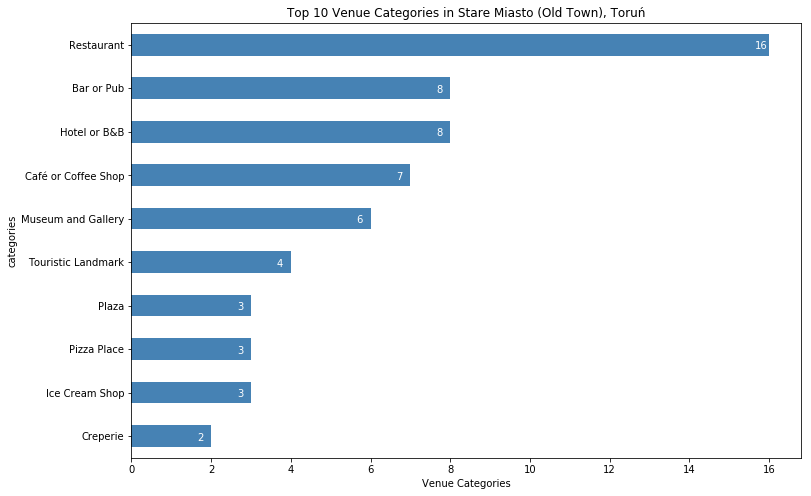

In [35]:
cat_top10.plot(kind='barh', figsize=(12, 8), color='steelblue')
plt.xlabel('Venue Categories')
plt.title('Top 10 Venue Categories in Stare Miasto (Old Town), Toruń')

# annotate value labels to each venue type
for index, value in enumerate(cat_top10): 
    label = format(int(value), ',') # format int with commas
# place text at the end of bar (subtracting 0.35 from x, and
# add 0.1 to y to make it fit within the bar
    plt.annotate(label, xy=(value - 0.35, index + 0.1), color='white')

plt.gca().invert_yaxis()
plt.show()


### Step 6: Get an Overview of the Overall Lively Business Areas around Toruń (Nearby Venues of ALL Neighbourhoods)

To look at the distribution around all neightbourhood areas in Torun. 

A recap of the 24 boroughts on descending order of distance to downtown in km below. 

In [36]:
df.head(10)


,Boroughs,Latitude,Longitude,Distance downtown (km)
0,Stare Miasto,53.011672,18.609319,0.000000
1,Rybaki,53.006466,18.591805,1.306968
2,Chełmińskie Przedmieście,53.022616,18.594666,1.562586
3,Jakubskie Przedmieście,53.019558,18.634295,1.886896
4,Mokre,53.028967,18.621943,2.100365
5,Piaski,52.999470,18.583759,2.183068
6,Bydgoskie Przedmieście,53.010490,18.576364,2.208700
7,Przedmieście,53.010490,18.576364,2.208700
8,Koniuchy,53.033814,18.599533,2.547583
9,Stawki,52.991229,18.635039,2.851184


In [37]:
# Explore neighbourhoods in the Torun area, Poland
# create a function to repeat the same process 
# to all the boroughs in Torun area

def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

torun_venues = getNearbyVenues(names=df['Boroughs'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )
print('Got Neighbourhoods around Torun and their venues-list.')

Got Neighbourhoods around Torun and their venues-list.


All venues of all neighbourhoods retrieved. We expected the data retrived by a radius around neightbourhood centers will result in duplication of business venue retrieval. 

Next we will look at the unique venues and count.

In [38]:
# check the size of the resulting dataframe of torun_venues (uncategorized)
print(torun_venues.shape)
torun_venues

(263, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Stare Miasto,53.011672,18.609319,Koi Sushi,53.011778,18.608490,Sushi Restaurant
1,Stare Miasto,53.011672,18.609319,Róże i Zen,53.010368,18.608665,Café
2,Stare Miasto,53.011672,18.609319,Szeroka No 9,53.010660,18.608163,Restaurant
3,Stare Miasto,53.011672,18.609319,Central Coffee Perks,53.010978,18.608622,Coffee Shop
4,Stare Miasto,53.011672,18.609319,Klub NRD,53.011052,18.612019,Pub
5,Stare Miasto,53.011672,18.609319,Lenkiewicz Lody,53.010852,18.609500,Ice Cream Shop
6,Stare Miasto,53.011672,18.609319,Rynek Staromiejski,53.010576,18.603919,Plaza
7,Stare Miasto,53.011672,18.609319,Kredens,53.011325,18.605119,Pub
8,Stare Miasto,53.011672,18.609319,Ratusz,53.010754,18.604300,History Museum
9,Stare Miasto,53.011672,18.609319,Royal India,53.012380,18.608643,Indian Restaurant


In [39]:
# find out how many unique categories can be curated from all the returned venues
print('There are {} uniques business around all boroughs in Toruń.'.format(len(torun_venues['Venue'].unique())))
print('There are {} uniques venue categories around all boroughs in Toruń.'.format(len(torun_venues['Venue Category'].unique())))

There are 168 uniques business around all boroughs in Toruń.
There are 81 uniques venue categories around all boroughs in Toruń.


Further clean the data by better grouping of Venue Category.

In [40]:
torun_venues_clean = torun_venues

# torun venues further categorized and cleaned
clean_df(torun_venues_clean, 'Venue Category')

torun_venues_clean # further clean and group the Venue Category

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Stare Miasto,53.011672,18.609319,Koi Sushi,53.011778,18.608490,Restaurant
1,Stare Miasto,53.011672,18.609319,Róże i Zen,53.010368,18.608665,Café or Coffee Shop
2,Stare Miasto,53.011672,18.609319,Szeroka No 9,53.010660,18.608163,Restaurant
3,Stare Miasto,53.011672,18.609319,Central Coffee Perks,53.010978,18.608622,Café or Coffee Shop
4,Stare Miasto,53.011672,18.609319,Klub NRD,53.011052,18.612019,Bar or Pub
5,Stare Miasto,53.011672,18.609319,Lenkiewicz Lody,53.010852,18.609500,Ice Cream Shop
6,Stare Miasto,53.011672,18.609319,Rynek Staromiejski,53.010576,18.603919,Plaza
7,Stare Miasto,53.011672,18.609319,Kredens,53.011325,18.605119,Bar or Pub
8,Stare Miasto,53.011672,18.609319,Ratusz,53.010754,18.604300,Museum and Gallery
9,Stare Miasto,53.011672,18.609319,Royal India,53.012380,18.608643,Restaurant


In [41]:
# find out how many unique categories from all the returned venues after further grouping the categories
print('There are {} uniques venue categories around all boroughs in Toruń after further grouping.'.format(len(torun_venues['Venue Category'].unique())))

There are 60 uniques venue categories around all boroughs in Toruń after further grouping.


### Step 7: The Overall Top 10 Business Category Around Torun

We plot by the top10 of **Venue Category** count in ALL Neighbourhoods.

In [42]:
torun_venue_count = torun_venues_clean['Venue Category'].value_counts().to_frame()
torun_venue_count.rename(columns={'Venue Category': 'value_counts'}, inplace=True)
torun_venue_count.index.name = 'Venue Category'

torun_venue_count = torun_venue_count.reset_index()
torun_venue_count

torun_cat_count_clean = torun_venue_count.groupby(['Venue Category'],as_index=True).sum().sort_values(by='value_counts', ascending=False)
torun_cat_count_clean

,value_counts
Venue Category,
Restaurant,33
Supermarket,19
Hotel or B&B,15
Bar or Pub,15
Grocery Store,14
Café or Coffee Shop,14
Museum and Gallery,13
Bus Station,12
Pizza Place,9


In [43]:
torun_top10 = torun_cat_count_clean['value_counts'].head(10)
torun_top10

Venue Category
Restaurant             33
Supermarket            19
Hotel or B&B           15
Bar or Pub             15
Grocery Store          14
Café or Coffee Shop    14
Museum and Gallery     13
Bus Station            12
Pizza Place             9
Shopping Mall           8
Name: value_counts, dtype: int64

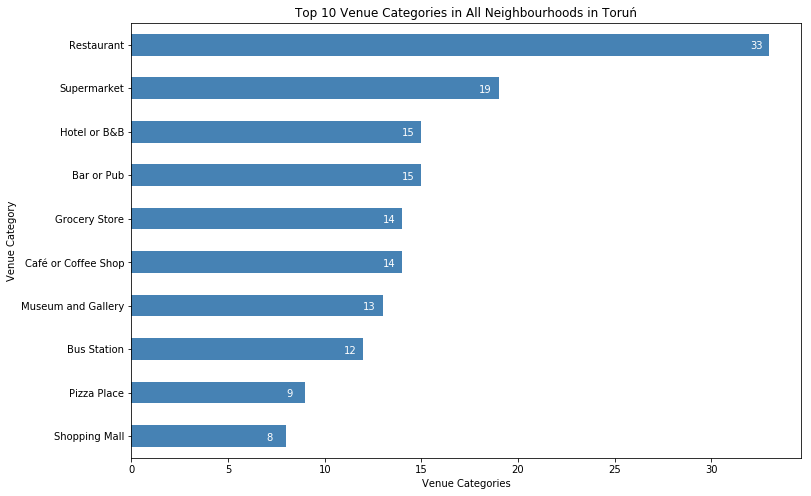

In [44]:
torun_top10.plot(kind='barh', figsize=(12, 8), color='steelblue')
plt.xlabel('Venue Categories')
plt.title('Top 10 Venue Categories in All Neighbourhoods in Toruń')

# annotate value labels to each venue type
for index, value in enumerate(torun_top10): 
    label = format(int(value), ',') # format int with commas
# place text at the end of bar (subtracting 0.35 from x, and
# add 0.1 to y to make it fit within the bar
    plt.annotate(label, xy=(value - 1, index + 0.1), color='white')

plt.gca().invert_yaxis()
plt.show()

Note that now we have now obtain the basic insight of our data. 

- We performed further cleaning and grouping
- We also compare preliminary the data according to a ascending order to distance downtown (proximity to business center), and
- By descending order of the number of business activity

By now we understand our data better.

This concludes the data gathering and cleaning. As it goes, we will further crunch our data to provide different visualizations as our analysis proceed.


## Methodology

In this project we will approach the business problem of opening a yoga studio around Toruń by understanding the business livelihood around the area, identify the type and robustness of buesiness activity and analyze potential locations that are favorable to our target business, a yoga studio in this case.

We adopt a methodology in three stages:

1. Identify the location, category and distribution of all business venues around the targeted business aread, Toruń. This enables us to have a quick overview of business activities category distributions and identify the most robust business areas.


2. Use heatmaps and frequency analysis to analyze the density of Old Town business activities and identify a few potential good locations for the yoga studio


3. Use K-means clustering to refine the search down to specific requirements, for example,
    - within 500 meters to hotels,
    - at least 500 meters away from bars or clubs which may be too loud or attract alcoholics




## Analysis

In Step 1 we want to confirm our understanding the robustness of business is related to the distance of town center (old town), which is supposed to be the center of business activity.

We make educated assumption that because this time the area chosen is a smaller town and we want to assume that business is better at areas where human activities are very active.

The direction of our business decision takes off from here.

### Step 1: Data Visualization - Confirm the Relationship of Overall Business Activity (Robustness) against Distance to Old Town

We compose a Scatter Plot by **Venue Categories Count** and **Distance downtown (km)**.

In [45]:
# merge the categories count to neighbourhoods of torun data
categories_count = torun_venues_clean.groupby('Neighbourhood')['Neighbourhood'].count().rename('Count').reset_index()
categories_count


,Neighbourhood,Count
0,Barbarka,2
1,Bielany,8
2,Bydgoskie Przedmieście,14
3,Chełmińskie Przedmieście,13
4,Czerniewice,6
5,Grębocin nad Strugą,2
6,Jakubskie Przedmieście,15
7,Kaszczorek,2
8,Katarzynka,5
9,Koniuchy,11


In [46]:
torun_merged = df
torun_merged.rename(columns={'Boroughs': 'Neighbourhood'}, inplace=True)
torun_merged = torun_merged.join(categories_count.set_index('Neighbourhood'), on='Neighbourhood')
torun_merged = torun_merged.fillna(0)
torun_merged['Count'] = torun_merged['Count'].astype(int) # change column Count from float to int to create scatter plot
torun_merged


,Neighbourhood,Latitude,Longitude,Distance downtown (km),Count
0,Stare Miasto,53.011672,18.609319,0.000000,77
1,Rybaki,53.006466,18.591805,1.306968,30
2,Chełmińskie Przedmieście,53.022616,18.594666,1.562586,13
3,Jakubskie Przedmieście,53.019558,18.634295,1.886896,15
4,Mokre,53.028967,18.621943,2.100365,12
5,Piaski,52.999470,18.583759,2.183068,3
6,Bydgoskie Przedmieście,53.010490,18.576364,2.208700,14
7,Przedmieście,53.010490,18.576364,2.208700,14
8,Koniuchy,53.033814,18.599533,2.547583,11
9,Stawki,52.991229,18.635039,2.851184,3


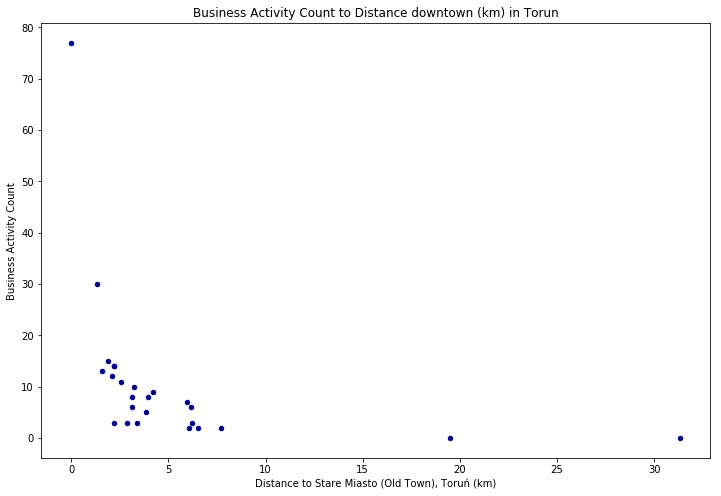

In [47]:
torun_merged.plot(kind='scatter', x='Distance downtown (km)', y='Count', figsize=(12, 8), color='darkblue')

plt.title('Business Activity Count to Distance downtown (km) in Torun')
plt.xlabel('Distance to Stare Miasto (Old Town), Toruń (km)')
plt.ylabel('Business Activity Count')

plt.show()

#### Note that Regression Plot does not illustrate a good visualization of distribution activity

Text(0.5, 1.0, 'Venue Categories Count to Distance downtown (km) in Torun')

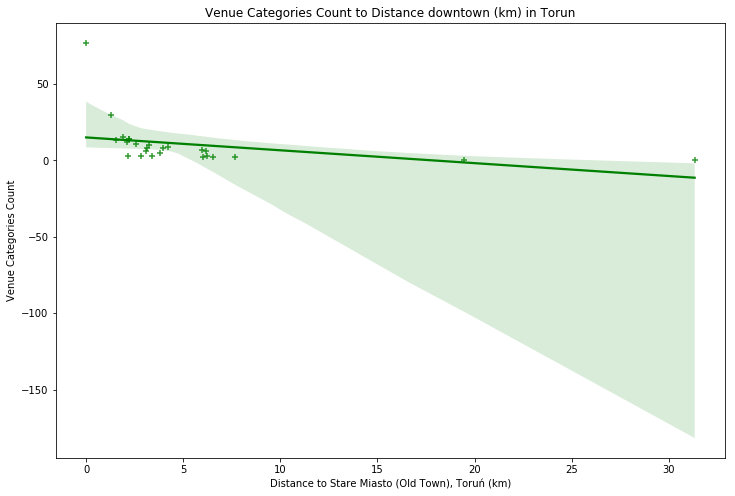

In [48]:
# Note that a Regression Plot does not looks like a good visualization
plt.figure(figsize=(12, 8))
ax = sns.regplot(x='Distance downtown (km)', y='Count', 
                 data=torun_merged, color='green', marker='+')
ax.set(xlabel='Distance to Stare Miasto (Old Town), Toruń (km)', 
       ylabel='Venue Categories Count') # add x- and y-labels
ax.set_title('Venue Categories Count to Distance downtown (km) in Torun') # add title

### A better visualization of the distribution of overall business activity

In [49]:
import plotly.express as px

fig = px.scatter(torun_merged, x="Distance downtown (km)", y="Count", 
                 trendline="lowess", 
                 size=torun_merged.Count, 
                 title='Venue Categories Count to Distance downtown (km) in Torun')

fig.update_traces(marker=dict(line=dict(width=1,
                                        color='Black')),
                  selector=dict(mode='markers'))

fig.show()


### Map Visualization of the Overall Business Activities in Toruń


In [50]:
torun_map = folium.Map(location=torun_corr, zoom_start=12)

folium.Marker(old_town_coor, popup='Stare Miasto (Old Town), Torun').add_to(torun_map)
torun_all_venues = torun_venues_clean
torun_all_venues.rename(columns={'Venue Latitude': 'Latitude'}, inplace=True)
torun_all_venues.rename(columns={'Venue Longitude': 'Longitude'}, inplace=True)

for lat, lon, label in zip(torun_all_venues.Latitude,
                           torun_all_venues.Longitude,
                           torun_all_venues.Venue):
    label = folium.Popup(label, parse_html=True)
    # color = 'red' if is_italian else 'blue' (reference only)
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        color='blue', # color=color
        fill=True,
        fill_color='blue', # fill_color='color'
        fill_opacity=1,
        parse_html=False).add_to(torun_map)
torun_map


Upon Step 1, we set the direction of our business decision.

### Step 2: Extract Meaningful Data from the Overall Business Activity

Relating to our business problem, we want to look at potention venues to open a yoga studio or conduct yoga related activies.

For this we identify:
1. **Related Venue** that may encourage potential customers to our business, and 
2. **Complementary Venues** which may bring existing customers of complementary business into our offerings.


### 1. Frequency Analysis: Top 10 neighbourhood boroughs by business activity Robustness

Sort by descending order from more business (move lively) to less.

In [51]:
# Analyze Each Neighbourhood

# one hot encoding
torun_onehot = pd.get_dummies(torun_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
torun_onehot['Neighbourhood'] = torun_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [torun_onehot.columns[-1]] + list(torun_onehot.columns[:-1])
torun_onehot = torun_onehot[fixed_columns]

torun_onehot.head()

,Neighbourhood,Airport,Athletics & Sports,Auto Garage,BBQ Joint,Bakery,Bar or Pub,Bistro,Boarding House,Bookstore,...,Skating Rink,Snack Place,Sporting Goods Shop,Stadium,Supermarket,Theater,Touristic Landmark,Track,Train Station,Zoo
0,Stare Miasto,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Stare Miasto,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Stare Miasto,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Stare Miasto,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Stare Miasto,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
# examine the new dataframe size
torun_onehot.shape

(263, 61)

In [53]:
torun_df = torun_onehot.groupby('Neighbourhood').mean().reset_index()
torun_df.head()



,Neighbourhood,Airport,Athletics & Sports,Auto Garage,BBQ Joint,Bakery,Bar or Pub,Bistro,Boarding House,Bookstore,...,Skating Rink,Snack Place,Sporting Goods Shop,Stadium,Supermarket,Theater,Touristic Landmark,Track,Train Station,Zoo
0,Barbarka,0.000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
1,Bielany,0.125,0.0,0.0,0.000000,0.0,0.125000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
2,Bydgoskie Przedmieście,0.000,0.0,0.0,0.071429,0.0,0.071429,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.142857,0.0,0.0,0.000000,0.000000,0.071429
3,Chełmińskie Przedmieście,0.000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.076923,0.0,0.0,0.076923,0.076923,0.0,0.0,0.076923,0.000000,0.000000
4,Czerniewice,0.000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.166667,0.000000


In [54]:
# print each neighborhood 
# along with the top 5 most common venues
num_top_venues = 5

for hood in torun_df['Neighbourhood']:
    print("----"+hood+"----")
    temp = torun_df[torun_df['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')
    


----Barbarka----
                  venue  freq
0          Hotel or B&B   0.5
1  Other Great Outdoors   0.5
2               Airport   0.0
3    Athletics & Sports   0.0
4        Ice Cream Shop   0.0


----Bielany----
           venue  freq
0    Bus Station  0.25
1        Airport  0.12
2       Creperie  0.12
3         Market  0.12
4  Grocery Store  0.12


----Bydgoskie Przedmieście----
           venue  freq
0  Grocery Store  0.14
1    Supermarket  0.14
2            Zoo  0.07
3     Restaurant  0.07
4    Pizza Place  0.07


----Chełmińskie Przedmieście----
                 venue  freq
0         Skating Rink  0.08
1            Multiplex  0.08
2           Restaurant  0.08
3         Hotel or B&B  0.08
4  Café or Coffee Shop  0.08


----Czerniewice----
                 venue  freq
0           Restaurant  0.17
1         Burger Joint  0.17
2        Train Station  0.17
3  Café or Coffee Shop  0.17
4    Food & Drink Shop  0.17


----Grębocin nad Strugą----
                venue  freq
0        Hote

### Top 10 Venues for Top 10 boroughs in Torun area

Next we look at the Top 10 Venues. Due to simplicity of data, Top 10 Venues of all neighbourhoods are shown in order to show the overall full picture of the Torun area.

If the business activity around an area is enormous, it is suggested to perform Top 10 Venues for the Top 10 neighbourhoods.

In [55]:
# display the top 10 venues for each neighborhood

# write a function to sort the venues in descending order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

# create the new dataframe 
# and display top 10 venues

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhood'] = torun_df['Neighbourhood']

for ind in np.arange(torun_df.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(torun_df.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()


,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barbarka,Hotel or B&B,Other Great Outdoors,Zoo,Candy Store,Food Court,Food & Drink Shop,Flea Market,Farmers Market,Factory,Electronics Store
1,Bielany,Bus Station,Airport,Bar or Pub,Grocery Store,Creperie,Market,Pizza Place,Farmers Market,Factory,Clothing Store
2,Bydgoskie Przedmieście,Grocery Store,Supermarket,Zoo,Shopping Mall,Creperie,Bus Stop,Bus Station,Park,Restaurant,Pizza Place
3,Chełmińskie Przedmieście,Food & Drink Shop,Skating Rink,Bus Station,Pizza Place,Light Rail Station,Restaurant,Hotel or B&B,Café or Coffee Shop,Multiplex,Electronics Store
4,Czerniewice,Train Station,Convenience Store,Restaurant,Burger Joint,Café or Coffee Shop,Food & Drink Shop,Flea Market,Farmers Market,Factory,Candy Store


In [56]:
# Cluster Neighborhoods
# set number of clusters
kclusters = 5

torun_clustering = torun_df.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(torun_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 0, 0, 0, 0, 1, 0, 4, 0, 0], dtype=int32)

In [57]:
# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
torun_merged2 = df
torun_merged2 = torun_merged2.rename({'Boroughs': 'Neighbourhood'}, axis=1)
torun_merged2.head()


,Neighbourhood,Latitude,Longitude,Distance downtown (km)
0,Stare Miasto,53.011672,18.609319,0.000000
1,Rybaki,53.006466,18.591805,1.306968
2,Chełmińskie Przedmieście,53.022616,18.594666,1.562586
3,Jakubskie Przedmieście,53.019558,18.634295,1.886896
4,Mokre,53.028967,18.621943,2.100365


In [58]:
# merge torun grouped data with torun_data to add latitude/longitude for each neighborhood
torun_merged2 = torun_merged2.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')
torun_merged2 = torun_merged2.fillna(0)
torun_merged2['Cluster Labels'] = torun_merged2['Cluster Labels'].astype(int) # change column Cluster Label from float to int

torun_merged2.head() # check the last columns!


,Neighbourhood,Latitude,Longitude,Distance downtown (km),Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Stare Miasto,53.011672,18.609319,0.000000,0,Restaurant,Bar or Pub,Hotel or B&B,Café or Coffee Shop,Museum and Gallery,Touristic Landmark,Plaza,Ice Cream Shop,Pizza Place,Creperie
1,Rybaki,53.006466,18.591805,1.306968,0,Museum and Gallery,Bar or Pub,Café or Coffee Shop,Hotel or B&B,Restaurant,Touristic Landmark,Zoo,Food Court,Grocery Store,Creperie
2,Chełmińskie Przedmieście,53.022616,18.594666,1.562586,0,Food & Drink Shop,Skating Rink,Bus Station,Pizza Place,Light Rail Station,Restaurant,Hotel or B&B,Café or Coffee Shop,Multiplex,Electronics Store
3,Jakubskie Przedmieście,53.019558,18.634295,1.886896,0,Bus Station,Gym,Electronics Store,Clothing Store,Restaurant,Shoe Store,Museum and Gallery,Shopping Mall,Sporting Goods Shop,Train Station
4,Mokre,53.028967,18.621943,2.100365,0,Restaurant,Gas Station,Supermarket,Shopping Mall,Museum and Gallery,Train Station,Bakery,Diner,Comedy Club,Convenience Store


By use of K-means, the business activities are clustered into 5 clusters by rainbow colors shown on map.

In [59]:
# create map
map_clusters = folium.Map(location=torun_corr, zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, neighbourhood, cluster in zip(
        torun_merged2['Latitude'], 
        torun_merged2['Longitude'], 
        torun_merged2['Neighbourhood'], 
        torun_merged2['Cluster Labels']):
    label = folium.Popup(str(neighbourhood) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

Examine each Cluster and determine the discriminating venue categories that distinguish that cluster.

In [60]:
# Examine Clusters

# Cluster 1
torun_merged2.loc[torun_merged2['Cluster Labels'] == 0, torun_merged2.columns[[1] + list(range(5, torun_merged2.shape[1]))]]


,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,53.011672,Restaurant,Bar or Pub,Hotel or B&B,Café or Coffee Shop,Museum and Gallery,Touristic Landmark,Plaza,Ice Cream Shop,Pizza Place,Creperie
1,53.006466,Museum and Gallery,Bar or Pub,Café or Coffee Shop,Hotel or B&B,Restaurant,Touristic Landmark,Zoo,Food Court,Grocery Store,Creperie
2,53.022616,Food & Drink Shop,Skating Rink,Bus Station,Pizza Place,Light Rail Station,Restaurant,Hotel or B&B,Café or Coffee Shop,Multiplex,Electronics Store
3,53.019558,Bus Station,Gym,Electronics Store,Clothing Store,Restaurant,Shoe Store,Museum and Gallery,Shopping Mall,Sporting Goods Shop,Train Station
4,53.028967,Restaurant,Gas Station,Supermarket,Shopping Mall,Museum and Gallery,Train Station,Bakery,Diner,Comedy Club,Convenience Store
6,53.010490,Grocery Store,Supermarket,Zoo,Shopping Mall,Creperie,Bus Stop,Bus Station,Park,Restaurant,Pizza Place
7,53.010490,Grocery Store,Supermarket,Zoo,Shopping Mall,Creperie,Bus Stop,Bus Station,Park,Restaurant,Pizza Place
8,53.033814,Restaurant,Supermarket,Pizza Place,Café or Coffee Shop,Gas Station,Grocery Store,Bakery,Bar or Pub,Food Court,Food & Drink Shop
10,52.987964,Bus Stop,Supermarket,Food & Drink Shop,Grocery Store,Bus Station,Train Station,Bakery,Comedy Club,Gas Station,Food Court
11,53.025359,Bus Station,Airport,Bar or Pub,Grocery Store,Creperie,Market,Pizza Place,Farmers Market,Factory,Clothing Store


In [61]:
# Cluster 2
torun_merged2.loc[torun_merged2['Cluster Labels'] == 1, torun_merged2.columns[[1] + list(range(5, torun_merged2.shape[1]))]]


,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
21,53.053819,Hotel or B&B,Other Great Outdoors,Zoo,Candy Store,Food Court,Food & Drink Shop,Flea Market,Farmers Market,Factory,Electronics Store
22,53.048392,Hotel or B&B,Market,Zoo,Candy Store,Food Court,Food & Drink Shop,Flea Market,Farmers Market,Factory,Electronics Store


In [62]:
# Cluster 3
torun_merged2.loc[torun_merged2['Cluster Labels'] == 2, torun_merged2.columns[[1] + list(range(5, torun_merged2.shape[1]))]]


,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,52.999273,Food & Drink Shop,Auto Garage,Zoo,Candy Store,Gas Station,Food Court,Flea Market,Farmers Market,Factory,Electronics Store


In [63]:
# Cluster 4
torun_merged2.loc[torun_merged2['Cluster Labels'] == 3, torun_merged2.columns[[1] + list(range(5, torun_merged2.shape[1]))]]


,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,52.99947,Bus Stop,Convenience Store,River,Café or Coffee Shop,Food Court,Food & Drink Shop,Flea Market,Farmers Market,Factory,Electronics Store


In [64]:
# Cluster 5
torun_merged2.loc[torun_merged2['Cluster Labels'] == 4, torun_merged2.columns[[1] + list(range(5, torun_merged2.shape[1]))]]


,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
9,52.991229,Supermarket,Auto Garage,Zoo,Café or Coffee Shop,Food Court,Food & Drink Shop,Flea Market,Farmers Market,Factory,Electronics Store
18,53.007971,Bus Stop,Supermarket,Café or Coffee Shop,Food Court,Food & Drink Shop,Flea Market,Farmers Market,Factory,Electronics Store,Diner


From the 5 clusters, we can safely arrive to an early analysis that below business activities form the most robust business activities around Toruń **business clusters**:

1. Restaurants
2. Hotels
3. Bars, pubs & clubs
4. Food & drink Shop
5. Supermarket



On the other hand, the violin plot below visualize the densitiy estimation by use of the frequency distributions of business activities in **each neighbourhood**.


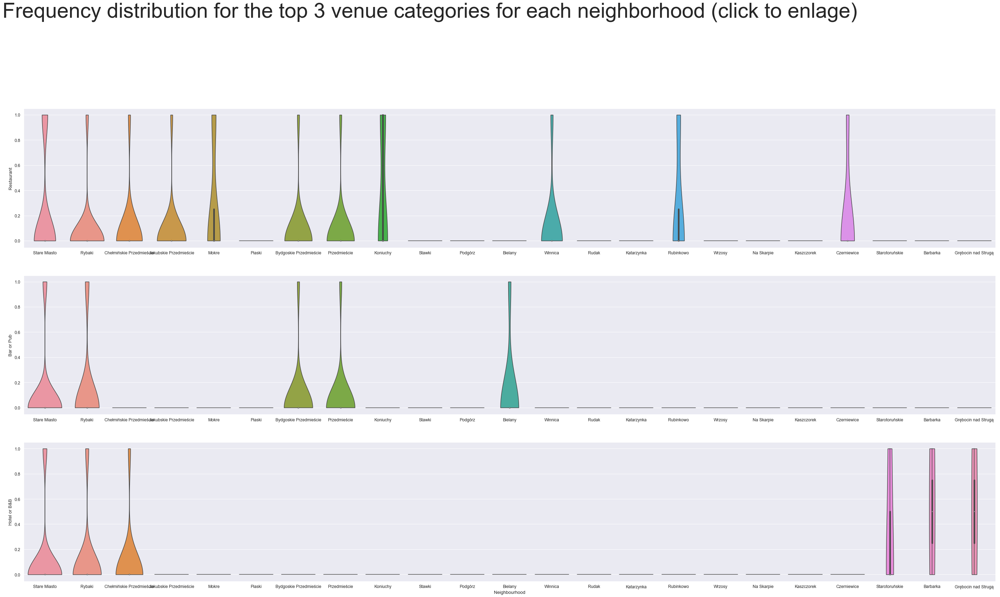

In [65]:
fig = plt.figure(figsize=(50,25))
sns.set(font_scale=1.1)

ax = plt.subplot(3,1,1)
sns.violinplot(x="Neighbourhood", y="Restaurant", data=torun_onehot, cut=0);
plt.xlabel("")

ax = plt.subplot(3,1,2)
sns.violinplot(x="Neighbourhood", y="Bar or Pub", data=torun_onehot, cut=0);
plt.xlabel("")

plt.subplot(3,1,3)
sns.violinplot(x="Neighbourhood", y="Hotel or B&B", data=torun_onehot, cut=0);

ax.text(-1.0, 3.1, 'Frequency distribution for the top 3 venue categories for each neighborhood (click to enlage)', fontsize=60)
plt.savefig ("Distribution_Frequency_Venues_3_categories.png", dpi=300)
plt.show()

### 2. Heatmap: Identify all yoga related business activities around Toruń (if at all), and visualize

Now we zoom in to the kind of business activities relating to our business problem.

In [66]:
# Category IDs corresponding to related business areas were taken from Foursquare web site 
# (https://developer.foursquare.com/docs/resources/categories):

yoga_related = ['4bf58dd8d48988d102941735', '4bf58dd8d48988d175941735', '4bf58dd8d48988d1fa931735',
                '58daa1558bbb0b01f18ec1ae','4bf58dd8d48988d1ed941735', '4bf58dd8d48988d175941735', '52f2ab2ebcbc57f1066b8b47', '503289d391d4c4b30a586d6a',
                '52f2ab2ebcbc57f1066b8b49', '4bf58dd8d48988d105941735', '52f2ab2ebcbc57f1066b8b48',
                '4bf58dd8d48988d176941735', '4bf58dd8d48988d101941735', '58daa1558bbb0b01f18ec203',
                '5744ccdfe4b0c0459246b4b2', '4bf58dd8d48988d106941735', '590a0744340a5803fd8508c3',
                '4bf58dd8d48988d1f8931735', '4f4530a74b9074f6e4fb0100',
                '4bf58dd8d48988d1ee931735', '4bf58dd8d48988d132951735', '5bae9231bedf3950379f89cb',
                '4bf58dd8d48988d12f951735', '56aa371be4b08b9a8d5734e1', '58daa1558bbb0b01f18ec1ae','4bf58dd8d48988d1ed941735']


def is_yoga_related(categories, specific_filter=None):
    yoga_studio = '4bf58dd8d48988d102941735'

    #'4bf58dd8d48988d175941735'  # Root category for gym / fitness center
    gym_or_fitness = ['4bf58dd8d48988d175941735', '52f2ab2ebcbc57f1066b8b47', '503289d391d4c4b30a586d6a',
                      '52f2ab2ebcbc57f1066b8b49', '4bf58dd8d48988d105941735', '52f2ab2ebcbc57f1066b8b48',
                      '4bf58dd8d48988d176941735', '4bf58dd8d48988d101941735', '58daa1558bbb0b01f18ec203',
                      '5744ccdfe4b0c0459246b4b2', '4bf58dd8d48988d106941735', '590a0744340a5803fd8508c3',
                      '4bf58dd8d48988d102941735']

    # '4bf58dd8d48988d1fa931735'  # Root category for hotel
    hotel_category = ['4bf58dd8d48988d1fa931735', '4bf58dd8d48988d1f8931735', '4f4530a74b9074f6e4fb0100',
                      '4bf58dd8d48988d1ee931735', '4bf58dd8d48988d132951735', '5bae9231bedf3950379f89cb',
                      '4bf58dd8d48988d12f951735', '56aa371be4b08b9a8d5734e1']

    spa_or_sauna = ['58daa1558bbb0b01f18ec1ae','4bf58dd8d48988d1ed941735']

    yoga_keywords = ['yoga', 'vinyasa', 'ashtanga', 'iyengar', 'bikram', 'jivamukti', 'power yoga', 'yin']

    yoga = False
    
    studio = False
    gym_fitness = False
    hotel = False
    spa_sauna = False
    specific = None
    
    for cat in categories:
        category_name = cat[0].lower()
        category_id = cat[1]
 
        for keyword in yoga_keywords:
            if keyword in category_name:
                yoga = True
                specific = 0
                
        if not (specific_filter is None) and category_id in yoga_studio:
            studio = True
            yoga = True
            specific = 0

        if not (specific_filter is None) and category_id in gym_or_fitness and not yoga_studio:
            gym_fitness = True
            yoga = True
            specific = 1

    
        if not (specific_filter is None) and category_id in hotel_category:
            hotel = True
            yoga = True
            specific = 2

        if not (specific_filter is None) and category_id in spa_or_sauna:
            spa_sauna = True
            yoga = True
            specific = 3
                
    return yoga, specific

def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def get_venues_near_location(lat, lon, category, client_id, client_secret, radius, limit=100):
    VERSION = '20190513'
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION,
        lat,  # torun_corr[0]
        lon,  # torun_corr[1]
        category,
        radius,
        LIMIT)
    try:
        results = requests.get(url).json()['response']['groups'][0]['items']
        venues = [(item['venue']['id'],
                   item['venue']['name'],
                   get_categories(item['venue']['categories']),
                   (item['venue']['location']['lat'], item['venue']['location']['lng']),
                   format_address(item['venue']['location']),
                   item['venue']['location']['distance']) for item in results]        
    except:
        venues = []
    return venues

print('function updated!')


function updated!


In [67]:
import pickle

# We will now go over the Toruń neighbourhood and 
# get nearby business activities relating to 
# 1) Yoga 2) Gym / Fitness 3) Hotel 4) Wellness (Sauna / Spa)

torun_venues_pickled = torun_venues
torun_venues_pickled = torun_venues_pickled.fillna(0)


torun_venues_pickled.to_pickle('./locations.pkl')


def get_yoga_related(lats, lons):
    # Root categories
    outdoors_and_recreation = '4d4b7105d754a06377d81259'
    travel_and_transports = '4d4b7105d754a06379d81259'
    categories = outdoors_and_recreation, travel_and_transports
    
    yoga_related = {}
    studios = {}
    gym_fitness_place = {}
    hotels = {}
    spa_sauna = {}
    local_yoga = []
    full_venue_list = []
    venue_list = []
    
    print('Obtaining venues around candidate locations:')
    for lat, lon in zip(lats, lons):
        for category in categories:
            venues = get_venues_near_location(lat, lon, category,
                                              CLIENT_ID, 
                                              CLIENT_SECRET, 
                                              radius=2500, 
                                              limit=100) # get list of venues in neightbourhood

            for venue in venues:
                venue_list.append(venue)
            
        area_yoga = []
        for place in venue_list:
            venue_id = place[0]
            venue_name = place[1]
            venue_categories = place[2]
            venue_latlon = place[3]
            venue_address = place[4]
            venue_distance = place[5]    
            
            is_yoga, specific_type = is_yoga_related(venue_categories, specific_filter=yoga_related)

            if is_yoga:
                x, y = lonlat_to_xy(venue_latlon[1], venue_latlon[0])
                yoga = (venue_id, venue_name, venue_latlon[0], venue_latlon[1], venue_address, venue_distance, specific_type, x, y)
                if venue_distance<=350:
                    area_yoga.append(yoga)
                yoga_related[venue_id] = yoga
                if specific_type == 0:
                    studios[venue_id] = yoga
                if specific_type == 1:
                    gym_fitness_place[venue_id] = yoga
                if specific_type == 2:
                    hotels[venue_id] = yoga
                if specific_type == 3:
                    spa_sauna[venue_id] = yoga
                    
        local_yoga.append(area_yoga)
        print('still processing ..', end='')
    print(' done.')
    return yoga_related, studios, gym_fitness_place, hotels, spa_sauna, local_yoga

# Try to load from local file system in case we did this before
yoga_related = {}
studios = {}
gym_fitness_place = {}
hotels = {}
spa_sauna = {}
local_yoga = []
loaded = False

try:
    with open('yoga_related_2500.pkl', 'rb') as f:
        yoga_related = pickle.load(f)
    with open('studios_2500.pkl', 'rb') as f:
        studios = pickle.load(f)
    with open('gym_fitness_place_2500.pkl', 'rb') as f:
        gym_fitness_place = pickle.load(f)
    with open('hotels_2500.pkl', 'rb') as f:
        hotels = pickle.load(f)
    with open('spa_sauna_2500.pkl', 'rb') as f:
        spa_sauna = pickle.load(f)
    with open('local_yoga_2500.pkl', 'rb') as f:
        local_yoga = pickle.load(f)
    print('Yoga related data loaded.')
    loaded = True
except:
    pass

Neighbourhood_lats = torun_merged['Latitude'].values.tolist()
Neighbourhood_lons = torun_merged['Longitude'].values.tolist()

# If load failed use the Foursquare API to get the data
if not loaded: # if loaded is False
    yoga_related, studios, gym_fitness_place, hotels, spa_sauna, local_yoga = get_yoga_related(Neighbourhood_lats, Neighbourhood_lons)
    
    # Let's persists this in local file system
    with open('yoga_related_2500.pkl', 'wb') as f:
        pickle.dump(yoga_related, f)
    with open('studios_2500.pkl', 'wb') as f:
        pickle.dump(studios, f)
    with open('gym_fitness_place_2500.pkl', 'wb') as f:
        pickle.dump(gym_fitness_place, f)
    with open('hotels_2500.pkl', 'wb') as f:
        pickle.dump(hotels, f)                
    with open('spa_sauna_2500.pkl', 'wb') as f:
        pickle.dump(spa_sauna, f)
    with open('local_yoga_2500.pkl', 'wb') as f:
        pickle.dump(local_yoga, f)
    print('Yoga related data saved.')


Yoga related data loaded.


In [68]:
print('Total number of potential yoga venues : ', len(yoga_related))
print('Total number of yoga studios : ', len(studios))
print('Total number of gym and fitness center : ', len(gym_fitness_place))
print('Total number of hotels : ', len(hotels))
print('Total number of spa or sauna : ', len(spa_sauna))
print('Total number of possible yoga venues that is within 350 meter of neighbourhood center: ', len(local_yoga))

Total number of potential yoga venues :  25
Total number of yoga studios :  0
Total number of gym and fitness center :  0
Total number of hotels :  25
Total number of spa or sauna :  0
Total number of possible yoga venues that is within 350 meter of neighbourhood center:  25


In [69]:
print('Quick preview of yoga related venues')
print('-----------------------')
for yoga in list(yoga_related.values())[:5]:
    print(yoga)
print()
print('Total:', len(yoga_related), 'Yoga related venues Returned.')

Quick preview of yoga related venues
-----------------------
('50958046011c0daa5e52a9c2', 'Copernicus Torun Hotel', 53.00780258488236, 18.597653544715303, 'Bulwar Filadelfijski 11, 87-100 Toruń, Polska', 2366, 2, 741352.6157062232, 5879194.12474656)
('4bd892732ecdce729bd5d0f2', 'Hotel 1231 Torun', 53.00978919793962, 18.611202415133768, 'Przedzamcze 6, 87-100 Toruń, Polska', 2334, 2, 742250.0909836073, 5879460.71324248)
('4be1ace38dd062b5f2783e3c', 'Pod Orlem Hotel', 53.0099496, 18.6079335, 'Mostowa 17, 98 Toruń, Polska', 2115, 2, 742029.9845049403, 5879467.501783284)
('4fa3b4326b74a8559633bcc9', 'Hotel Spichrz', 53.00874684676848, 18.608722404124943, 'ul. Mostowa 1, 87-100 Toruń, Polska', 2176, 2, 742089.6232198786, 5879336.44312025)
('4c6ac5f0897b1b8d5ba3b217', 'Hotel Filmar', 53.01910235282233, 18.608753665834946, 'Grudziądzka 37/45, 87-100 Torun, Polska', 1750, 2, 742033.7178650568, 5880487.88487669)

Total: 25 Yoga related venues Returned.


In [70]:
print('Quick preview of yoga related venues: Hotels')
print('-----------------------')
for hotel in list(hotels.values())[:5]:
    print(hotel)
print()
print('Total:', len(hotels), 'Possible yoga related venues (being hotels) Returned.')


Quick preview of yoga related venues: Hotels
-----------------------
('50958046011c0daa5e52a9c2', 'Copernicus Torun Hotel', 53.00780258488236, 18.597653544715303, 'Bulwar Filadelfijski 11, 87-100 Toruń, Polska', 2366, 2, 741352.6157062232, 5879194.12474656)
('4bd892732ecdce729bd5d0f2', 'Hotel 1231 Torun', 53.00978919793962, 18.611202415133768, 'Przedzamcze 6, 87-100 Toruń, Polska', 2334, 2, 742250.0909836073, 5879460.71324248)
('4be1ace38dd062b5f2783e3c', 'Pod Orlem Hotel', 53.0099496, 18.6079335, 'Mostowa 17, 98 Toruń, Polska', 2115, 2, 742029.9845049403, 5879467.501783284)
('4fa3b4326b74a8559633bcc9', 'Hotel Spichrz', 53.00874684676848, 18.608722404124943, 'ul. Mostowa 1, 87-100 Toruń, Polska', 2176, 2, 742089.6232198786, 5879336.44312025)
('4c6ac5f0897b1b8d5ba3b217', 'Hotel Filmar', 53.01910235282233, 18.608753665834946, 'Grudziądzka 37/45, 87-100 Torun, Polska', 1750, 2, 742033.7178650568, 5880487.88487669)

Total: 25 Possible yoga related venues (being hotels) Returned.


### Highlight the Relevant Business Venues (hotels in this case)

On top of the full scenario of business activities on the Torun map, below highlight in red are relevant business activity to give potential locations to open a yoga studio or offer yoga.

In [71]:
hotels_map_torun = torun_map
folium.Marker(old_town_coor, popup='Stare Miasto (Old Town)').add_to(hotels_map_torun)
for hotel in hotels.values():
    lat = hotel[2]; lon = hotel[3]
    specific_type = hotel[6]
    color = 'red' if specific_type == 2 else 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(hotels_map_torun)
hotels_map_torun


Note that now we have obtained a visualization of our data and assign meaning relating to business activities.

- We get an idea of the overall distribution of business activities around the Torun area. 
- We also visualize the business related venues of hotels or any potential yoga related venues to open our business nearby. 

Upon Step 2, we refine our business decision.

In [75]:
torun_boroughs_url = 'https://raw.githubusercontent.com/sylisy/Applied-Data-Science-Capstone/master/gadm36_POL_1-1.json'
torun_boroughs = requests.get(torun_boroughs_url).json()

def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

In [76]:
all_venues_latlons = [[lat, lon] 
                 for lat, lon in zip(torun_all_venues.Latitude, torun_all_venues.Longitude)]

hotel_latlons = [[hotel[2], hotel[3]] for hotel in hotels.values()]



In [78]:
map_torun = folium.Map(location=torun_corr, zoom_start=13)

folium.TileLayer('cartodbpositron').add_to(map_torun) #cartodbpositron cartodbdark_matter
HeatMap(hotel_latlons).add_to(map_torun)
folium.Marker(old_town_coor, popup='Stare Miasto (Old Town), Torun').add_to(map_torun)
folium.Circle(torun_corr, radius=1000, fill=False, color='white').add_to(map_torun)
folium.Circle(torun_corr, radius=2000, fill=False, color='white').add_to(map_torun)
folium.Circle(torun_corr, radius=3000, fill=False, color='white').add_to(map_torun)
folium.GeoJson(torun_boroughs, style_function=boroughs_style, name='geojson').add_to(map_torun)
map_torun


### Step 3: Refine Search Down to Specific Requirements

We want to look at possible business venues location to satisfy more specific requirements. For example

1. location that has a minimal distances from the hotels, which is potential relevant business venue.

2. Exclude bars, pubs or clubs, or see if possible to stay as far away from these alcoholic areas as possible


In [79]:
old_town_venues = nearby_venues
clean_df(old_town_venues, 'categories')
print(old_town_venues.shape)
old_town_venues


(77, 4)


,name,categories,lat,lng
0,Koi Sushi,Restaurant,53.011778,18.608490
1,Róże i Zen,Café or Coffee Shop,53.010368,18.608665
2,Szeroka No 9,Restaurant,53.010660,18.608163
3,Central Coffee Perks,Café or Coffee Shop,53.010978,18.608622
4,Klub NRD,Bar or Pub,53.011052,18.612019
5,Lenkiewicz Lody,Ice Cream Shop,53.010852,18.609500
6,Rynek Staromiejski,Plaza,53.010576,18.603919
7,Kredens,Bar or Pub,53.011325,18.605119
8,Ratusz,Museum and Gallery,53.010754,18.604300
9,Royal India,Restaurant,53.012380,18.608643


Eliminate the venues that are hotels itself.
Eliminate the venues that belongs to the category 'Bar or Pub'


In [80]:
old_town_venues_clean = old_town_venues

old_town_venues_clean = old_town_venues_clean[~old_town_venues.categories.str.contains("Bar or Pub")]
old_town_venues_clean = old_town_venues_clean[~old_town_venues.categories.str.contains("Hotel")]

print(old_town_venues_clean.shape)
old_town_venues_clean



(61, 4)


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,name,categories,lat,lng
0,Koi Sushi,Restaurant,53.011778,18.608490
1,Róże i Zen,Café or Coffee Shop,53.010368,18.608665
2,Szeroka No 9,Restaurant,53.010660,18.608163
3,Central Coffee Perks,Café or Coffee Shop,53.010978,18.608622
5,Lenkiewicz Lody,Ice Cream Shop,53.010852,18.609500
6,Rynek Staromiejski,Plaza,53.010576,18.603919
8,Ratusz,Museum and Gallery,53.010754,18.604300
9,Royal India,Restaurant,53.012380,18.608643
10,Manekin,Creperie,53.012795,18.608610
11,Stara Pączkarnia,Bakery,53.010883,18.609015


Get venues that are as close as possible to Hotels

In [81]:
distances_to_hotel = []

for lat, lng in zip(old_town_venues_clean.lat, old_town_venues_clean.lng):
    min_distance = 1000
    for hotel in hotels.values():
        hotel_lat = hotel[2]
        hotel_lng = hotel[3]
        distance = calc_xy_distance(lat, lng, hotel_lat, hotel_lng)
        if distance <= min_distance:
            min_distance = distance
    distances_to_hotel.append(min_distance)

pd.options.mode.chained_assignment = None
old_town_venues_clean['Distance to Hotels'] = distances_to_hotel
old_town_venues_clean = old_town_venues_clean.sort_values('Distance to Hotels')
old_town_venues_clean

,name,categories,lat,lng,Distance to Hotels
71,Vistula Apartments,Boarding House,53.012137,18.616955,0.000000
16,Karczma Spichrz,Restaurant,53.008763,18.608807,0.000086
17,Żywe Muzeum Piernika,Museum and Gallery,53.008669,18.604709,0.000225
25,Stare Metropolis,Restaurant,53.011169,18.607271,0.000328
22,Karczma Gęsia Szyja,Diner,53.011158,18.607333,0.000372
12,Luizjana,Restaurant,53.009148,18.608837,0.000417
69,Centrum Gier Feniks,Hobby Shop,53.012693,18.611880,0.000453
27,Beza-krówka - naturalne lody rzemieślnicze,Ice Cream Shop,53.011214,18.606715,0.000459
56,Teatr im. Wilama Horzycy,Theater,53.012275,18.603031,0.000553
64,Plac Teatralny,Plaza,53.012859,18.603353,0.000575


Get venues that are as far away as possible from the category 'Bar or Pub'

In [82]:
# Again take away hotels, alcoholic places away from venues candidates 
old_town_venues_2 = old_town_venues

old_town_venues_2 = old_town_venues_2[~old_town_venues.categories.str.contains("Bar or Pub")]
old_town_venues_2 = old_town_venues_2[~old_town_venues.categories.str.contains("Hotel")]




/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [83]:
old_town_venues_alcohol = old_town_venues[old_town_venues.values == 'Bar or Pub']
old_town_venues_alcohol



,name,categories,lat,lng
4,Klub NRD,Bar or Pub,53.011052,18.612019
7,Kredens,Bar or Pub,53.011325,18.605119
21,Coffee & Whisky,Bar or Pub,53.008623,18.603445
29,kafefajka,Bar or Pub,53.011348,18.609388
44,Kadr,Bar or Pub,53.008652,18.605959
51,Lizard King,Bar or Pub,53.009336,18.604975
55,Dwa Światy,Bar or Pub,53.009096,18.603510
65,Carpe Diem,Bar or Pub,53.012181,18.603544


Finally, we make reference to different existing venues with regard to their

1. Closest distance to any hotels
2. Furthest distance to alcoholic places

as shown in below table for making our final choices of references to the venue location as to which areas in the Old Town of Torun is in the best potential and most favorable to open up a yoga studio or offer yoga.


In [84]:
distances_to_alcohol = []

for lat, lng in zip(old_town_venues_clean.lat, old_town_venues_clean.lng):
    min_distance = 0
    for latitude, longitude in zip(old_town_venues_alcohol.lat,old_town_venues_alcohol.lng):
        distance = calc_xy_distance(lat, lng, latitude, longitude)
        if distance >= min_distance:
            min_distance = distance
    distances_to_alcohol.append(min_distance)

pd.options.mode.chained_assignment = None
old_town_venues_clean['Distance to alcohol'] = distances_to_alcohol

old_town_sort = old_town_venues_clean

old_town_sort = old_town_sort.sort_values(['Distance to Hotels', 'Distance to alcohol'], ascending=[True, False])
old_town_sort



,name,categories,lat,lng,Distance to Hotels,Distance to alcohol
71,Vistula Apartments,Boarding House,53.012137,18.616955,0.000000,0.013960
16,Karczma Spichrz,Restaurant,53.008763,18.608807,0.000086,0.006276
17,Żywe Muzeum Piernika,Museum and Gallery,53.008669,18.604709,0.000225,0.007688
25,Stare Metropolis,Restaurant,53.011169,18.607271,0.000328,0.004749
22,Karczma Gęsia Szyja,Diner,53.011158,18.607333,0.000372,0.004687
12,Luizjana,Restaurant,53.009148,18.608837,0.000417,0.006100
69,Centrum Gier Feniks,Hobby Shop,53.012693,18.611880,0.000453,0.009366
27,Beza-krówka - naturalne lody rzemieślnicze,Ice Cream Shop,53.011214,18.606715,0.000459,0.005306
56,Teatr im. Wilama Horzycy,Theater,53.012275,18.603031,0.000553,0.009070
64,Plac Teatralny,Plaza,53.012859,18.603353,0.000575,0.008852


## Results and Discussion <a name="results"></a>

Our analysis shows that most lively business activities in Toruń cluster around the Old Town area.

Since the Torun area is a town with a population of around two hundred thousand, we decide to often view the data on a whole for the full picture as the datasize is not huge.

The most robust business activity are 1) Restaurants 2) Bar, pubs & clubs 3) Hotels

We believe related business venues or activities like 1) Hotels & Resort 2) Gym & sports center 3) Wellness centers e.g. spa & sauna are **complementary business activities** relating to yoga which will benefit our business if we decide to open a yoga studio close to these places.

Last but not the least, we refine our requirements specifically to 1) close to hotels which helps our business, and 2) further away from alcoholic places e.g. bars & clubs which conflicts with or may harm our business in terms of the business nature.

Finally, we will expect to find an optimal location for our yoga studio by referencing potential venue candidates with regard to existing favorable businesses venues in the Old Town. We expect to look for possible venus vacancy near these candidates, which we believe to be benefitial to the nature of our business.


## Conclusion <a name="conclusion"></a>

We have approached the business problem of opening a yoga studio in the Toruń area by first identify good locations for business in terms of robustness to decide the direction of the business decision; 

Next analyze the nature and distribution of existing business activities in the area to confirm our business direction and make further interpretations and estimations. 

Finally refine the results with specific requirements pertaining to our business nature in order to further strengthen the case and generate convincing candidates that can support our final business decision.

In conclusion, the purpose of this capstone project is to showcase the ability and potential of data science to give solid support and evidence in the process of making business decision.

It should be well aware that when approaching different types of business decisions, the nature, background, product knowledge, competitor and any relevation contributing factors to the success of the business itself should be well researched and studied, so that the business problem or question is well defined, analyses go in the right directions and finally lead to good business solutions.